# Assignment 2: Epipolar geometry

In this assignment we will try out the things that we learned in our second part of the lecture -- epipolar geometry. The goal of this assignment is for you to understand how epipolar geometry is used in practice and see what the equations that we learned in class actually mean. There are five parts in this assignment. In the first two parts, we will get familier with camera models (intrinsic and extrinsic) as well as rotation and translation in 3D space. In the thrid part, we will do some coordinate conversion between OpenCV and OpenGL, so you don't get confused later on when you need to work on a project based on different coordinate system. For the forth part, we use OpenCV to retrieve the Fundamental matrix and verify with the ground-truth relative camera pose that it indeed is what we'd expect. At last, we will implement a quick optimization scheme using PyTorch to find the Fundamental matrix with the eight-point algorithm, with and without outliers and see what happens.

# Initial load of data, and what quick visualization of what we are dealing with (Already done for you)

/ubc/cs/research/kmyi/yjin/scratch/miniconda3/envs/535/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


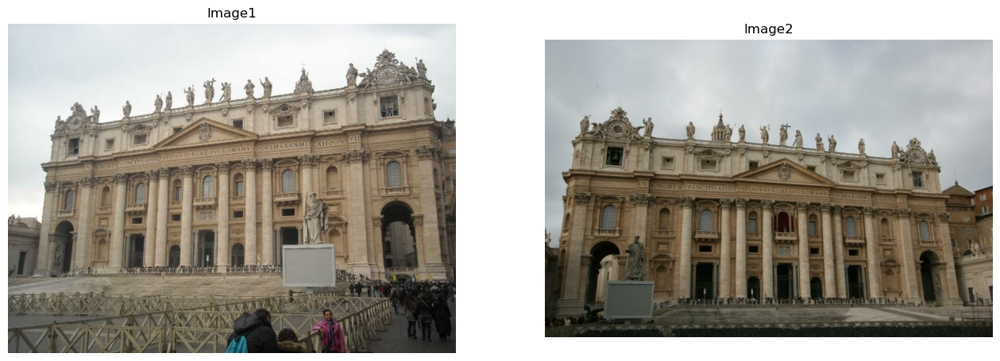

In [1]:
# Load image pair and the ground-truth calibration

# Calibration includes the intrinsic (K) and the relative camera pose (dR, dt)

import sys
import cv2
import os
import h5py
import numpy as np
import matplotlib.pyplot as plt
import torch
from tqdm import tqdm

from match_helper import extract_corrs, visualize_corrs, visualize_epipolar_lines

# A sample from st_peters_square in the dataset of CNe
data_dir = "data"
img1_name = "img1"
img2_name = "img2"
img1_fn = os.path.join(data_dir, img1_name+'.jpg')
img2_fn = os.path.join(data_dir, img2_name+'.jpg')
dep1_fn = os.path.join(data_dir, img1_name+'.h5')
dep2_fn = os.path.join(data_dir, img2_name+'.h5')
cameras_fn = os.path.join(data_dir, "camera_pose.h5")
points_fn = os.path.join(data_dir,"point_cloud.npy")

# Load image
img1 = cv2.cvtColor(cv2.imread(img1_fn), cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(cv2.imread(img2_fn), cv2.COLOR_BGR2RGB)

# Load depth map
with h5py.File(dep1_fn, "r") as f:
    dep1 = f['depth'][()]
with h5py.File(dep2_fn, "r") as f:
    dep2 = f['depth'][()]

# Read ground_truth calibration
with h5py.File(cameras_fn, "r") as f:
    R_1 = f['img1']['R'][()]
    t_1 = f['img1']['t'][()]
    K_1 = f['img1']['K'][()]
    R_2 = f['img2']['R'][()]
    t_2 = f['img2']['t'][()]
    K_2 = f['img2']['K'][()]

# Load point cloud 
points3d = np.load(points_fn)

# Show two images 
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(16, 8, forward=True)
ax1.imshow(img1)
ax1.set_title('Image1')
ax1.set_axis_off()
ax2.imshow(img2)
ax2.set_title('Image2')
ax2.set_axis_off()
plt.show()


# PART 1 -- Projection between two images (10pts)
We can project points in one image to another image if depth is given

Relative Pose cam1 -> cam2: 
 [[ 0.81804695 -0.11058057 -0.56442106]
 [ 0.15429573  0.98756467  0.03014715]
 [ 0.55406861 -0.11174954  0.82493637]] 
 [[3.5449737 ]
 [0.34801347]
 [1.06906606]]


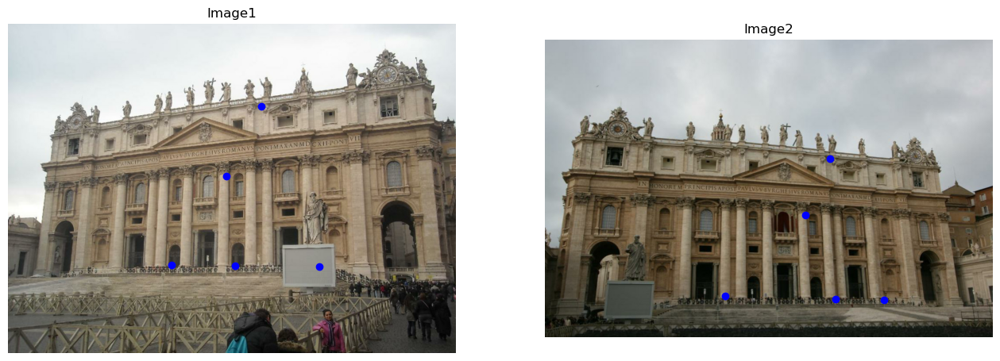

In [2]:
# (5 points) TODO: R_1. T_1, R_2, T_2 are rotation and translation from world coodinate to camera coordinante
# for camera 1 and camera 2 respectively. Please derive dR and dt that map camera 1 coordinate to 
# camera 2 coordinate.
dR =
dt =


print('Relative Pose cam1 -> cam2: \n {} \n {}'.format(dR, dt))

# Random sample 5 keypoints on image 1
kp1 = np.random.rand(5,2)*0.5+0.25
kp1[:,0] = kp1[:,0] * img1.shape[1]
kp1[:,1] = kp1[:,1] * img1.shape[0]
kp1 = np.round(kp1).astype(int)

# Get depth for sampled points from depth map
d1 = np.expand_dims(dep1[kp1[:, 1], kp1[:, 0]],axis=-1)

# (5 points) TODO: write a function that use depth (d1), relative pose (dR, dt), and camera intrinsic (K_1, K_2) 
# to map sampled keypoints on image1 to image2.
def point_mapping(kp1, d1, K_1, K_2, dR, dt):

    return kp1p

# applying mapping function to get projected points on image2
kp1p = point_mapping(kp1, d1, K_1, K_2, dR, dt)

# Show two images with keypoints
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_size_inches(16, 8, forward=True)
ax1.imshow(img1)
ax1.scatter(kp1[:,0], kp1[:,1], c='b')
ax1.set_title('Image1')
ax1.set_axis_off()
ax2.imshow(img2)
ax2.scatter(kp1p[:,0], kp1p[:,1], c='b')
ax2.set_title('Image2')
ax2.set_axis_off()
plt.show()

# Part2 -- Project point cloud to image (5pts)
Here, we project the point cloud from COLMAP recosntruction to image 1

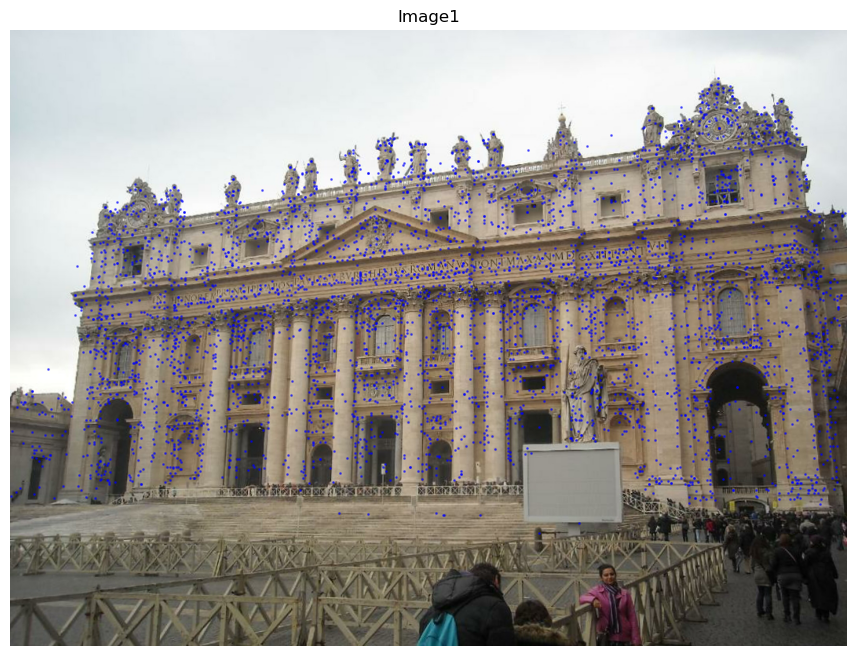

In [3]:

# (5 points) TODO: use R_1, t_1 and K_1 to project points to image
points2d = 

fig, (ax1) = plt.subplots(1, 1)
fig.set_size_inches(16, 8, forward=True)
ax1.imshow(img1)
ax1.scatter(points2d[:,0], points2d[:,1], c='b',s=1,alpha=0.5)
ax1.set_title('Image1')
ax1.set_axis_off()
plt.show()


# Part3 -- Conversion between OpenCV and OpenGL (10pts)
Computer vision people use extrinsic and intrinsic to describe camera model, while
computer graphic people use model, view, and projection matrix. In this part, you
need to convert one to the other. Here is an overview of [OpenGL coordinate system](https://learnopengl.com/Getting-started/Coordinate-Systems)
you may find it helpful.

Sanity check on NDC
x: max 0.9962839852073616 min -0.9989348655965224
y: max 0.8436710178034437 min -0.6299270134800207
z: max 0.9484431012427401 min -0.7940058262961386
w: max 1.0 min 1.0


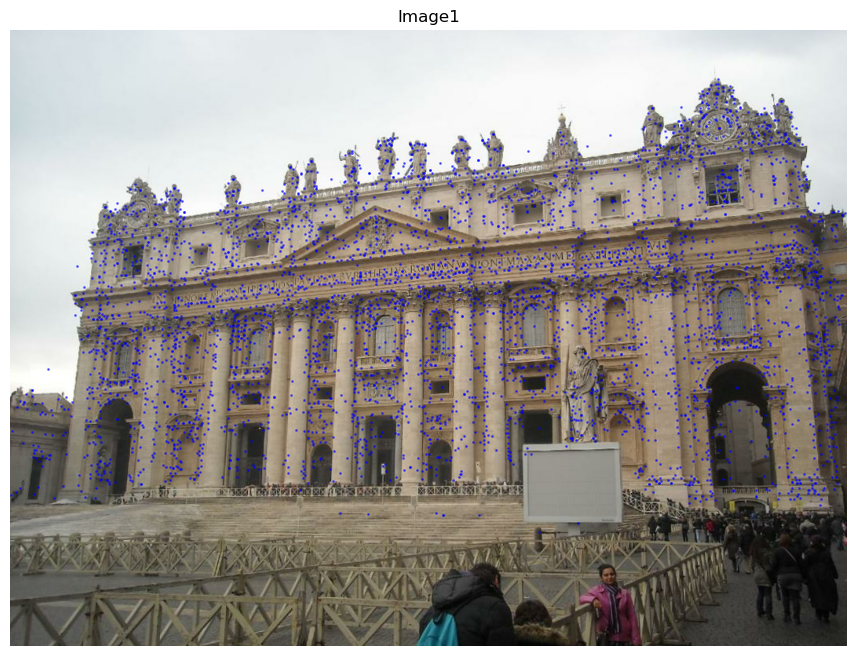

In [4]:
# (10 points) TODO: convert point cloud to Normalized Device Coordinates in OpenGL convention
# specificly convert points3d (3D point in OpenCV convention) to points_gl (points
# in NDC)
# points_gl[:,0]: x range in (-1,1), 
# points_gl[:,1]: y range in (-1,1),
# points_gl[:,2]: z range in (-1,1),
# points_gl[:,3] = 1
points_gl =

# Here we check max and min value in NDC. It should between -1 and 1 for the first 
# three dimension, and the last dimension should always be 1. 
print('Sanity check on NDC')
print('x: max {} min {}'.format(np.max(points_gl[:,0]),np.min(points_gl[:,0])))
print('y: max {} min {}'.format(np.max(points_gl[:,1]),np.min(points_gl[:,1])))
print('z: max {} min {}'.format(np.max(points_gl[:,2]),np.min(points_gl[:,2])))
print('w: max {} min {}'.format(np.max(points_gl[:,3]),np.min(points_gl[:,3])))
# Convert OpenGL NDC coordinate to OpenCV coordinate
h, w, _ = img1.shape
mat_ndc2img = np.array([[w/2,0,0,w/2],[0,h/2,0,h/2],[0,0,0,1]])
mat_gl2cv = np.array([[1,0,0],[0,-1,h],[0,0,1]])
points_cv = (mat_gl2cv@mat_ndc2img@points_gl.T).T
points_cv[:,:2] = points_cv[:,:2]/points_cv[:,[2]]
points_cv = points_cv[:,:2]

# show image
fig, (ax1) = plt.subplots(1, 1)
fig.set_size_inches(16, 8, forward=True)
ax1.imshow(img1)
ax1.scatter(points_cv[:,0], points_cv[:,1], c='b',s=1,alpha=0.5)
ax1.set_title('Image1')
ax1.set_axis_off()
plt.show()


## Generate Putative Correspondences

We use SIFT to create the correspondences between two images. Note that we use the bidirectional check to further improve the performance in the test phase.

The # of correspondences: 124


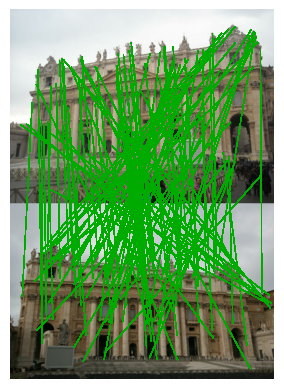

All putative coorespondences


In [5]:
# Generate Putative Correspondences with some heuristics. Have a look at how we
# actually filter things out here ;)
#
# Note: Try playing around with bi_check, ratio_th, numkp to see how it affects
# the matching
corrs = extract_corrs(img1, img2, bi_check=True, ratio_th=0.8, numkp=2000)

print("The # of correspondences: {}".format(len(corrs)))

visualize_corrs(img1, img2, corrs)
print("All putative coorespondences")


# Part 4 -- retrieving the fundamental matrix using open CV (40pts)



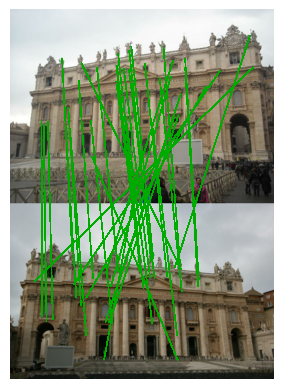

Inlier coorespondences


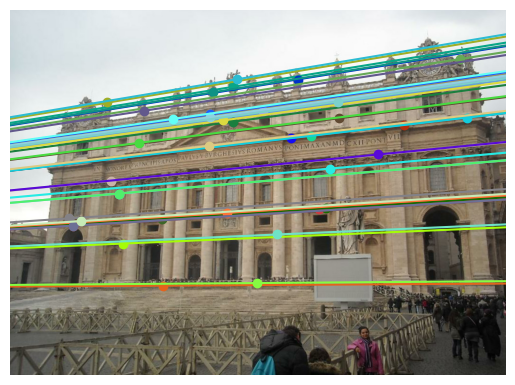

OpenCV Estimated epipolar lines for image 1


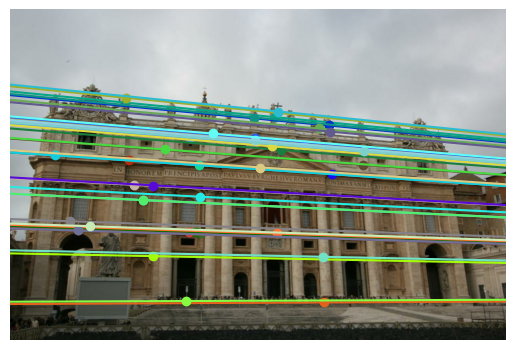

OpenCV Estimated epipolar lines for image 2


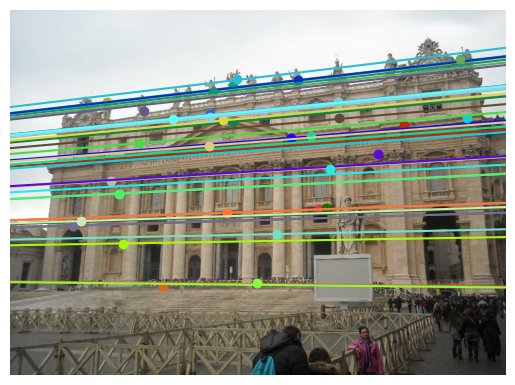

Ground-truth epipolar lines for image 1


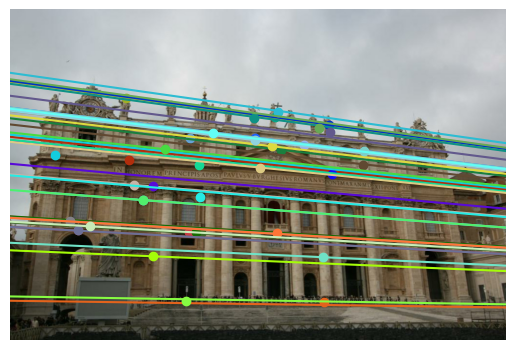

Ground-truth epipolar lines for image 2
Rotation between R1 and dR,
 [[ 0.74418689 -0.13211061 -0.6547768 ]
 [-0.13789882 -0.98951593  0.04292006]
 [-0.65358228  0.0583524  -0.75460268]]
Rotation between R2 and dR,
 [[ 0.99990779 -0.00305533 -0.01323139]
 [ 0.00317037  0.99995728  0.00868248]
 [ 0.01320429 -0.00872362  0.99987476]]
Estimated t,
 [[0.96793655]
 [0.06267254]
 [0.24325089]]
 and dt,
 [[0.95320984]
 [0.09357752]
 [0.28746174]]


In [6]:
# (5 points) TODO: Use OpenCV's findFundamentalMat function to retrieve the fundamental
# matrix.
#
# Note: OpenCV's findFundamentalMat offers various options, but we are
# interested in whatever gives best results. Try multiple of these options and
# use the best one. 


# (5 points) TODO: Visualize the inliers using `visualize_corrs function`
inlier_corrs =
visualize_corrs(img1, img2, inlier_corrs)
print("Inlier coorespondences")

# (5 points) TODO: Compute the ground truth fundamental matrix `F_gt` from
# calibration and dt, dR
def skew_symmetric(t):
    t = t.flatten()
    return np.array(
        [
            [0.0, t[2], -t[1]],
            [-t[2], 0.0, t[0]],
            [t[1], -t[0], 0.0],
        ]
    )
F_gt = np.linalg.inv(K_2).transpose() @ skew_symmetric(dt) @ dR @ np.linalg.inv(K_1)

# (5 points) TODO: Visualize epipolar lines using `visualise_epipolar_lines`
# function, after finishing the missing implementation. Note we want the
# corresponding points to have the same color in all visulizations
colors = np.random.rand(inlier_corrs.shape[0], 3)
visualize_epipolar_lines(img1, img2, inlier_corrs[:,:2], inlier_corrs[:, 2:], F, colors)
print("OpenCV Estimated epipolar lines for image 1")

visualize_epipolar_lines(img2, img1, inlier_corrs[:,2:], inlier_corrs[:, :2], F.T, colors)
print("OpenCV Estimated epipolar lines for image 2")

visualize_epipolar_lines(img1, img2, inlier_corrs[:,:2], inlier_corrs[:, 2:], F_gt, colors)
print("Ground-truth epipolar lines for image 1")

visualize_epipolar_lines(img2, img1, inlier_corrs[:,2:], inlier_corrs[:, :2], F_gt.T, colors)
print("Ground-truth epipolar lines for image 2")

# (5 points) TODO: Let's now decompose R/t from our estimated F, using the ground truth
# cameras to see how good our estimate is. We first convert F into E, then use
# cv2.decomposeEssentialMat.
R1, R2, t = 

# (5 points) TODO: Check estimated R/ts. 
#
# To do the Chirality check we would need to triangulate points, but let's
# leave that out of the scope of the assignment. Instead, we'll simply check
# how the two estimates of R1 and R2 differ from dR by checking the rotation
# matrix between them and dR, and directly checking dt and t after normalizing
# it to norm one. A proper way to compare them will be taught in class later.
diff_R1 = 
diff_R2 = 

print(f"Rotation between R1 and dR,\n {diff_R1}")
print(f"Rotation between R2 and dR,\n {diff_R2}")
print(f"Estimated t,\n {t/np.linalg.norm(t)}\n and dt,\n {dt/np.linalg.norm(dt)}")


## Discussions on estimated R and t
1) (5 points) Among the estimated rotations (R1, R2), which one seems to be the correct one? Also, is this estimate close? 

YOUR ANSWER HERE

2) (5 points) What about t? How would evaluate how accurate our estimate is? Note that our estimates are simularity accurate.

YOUR ANSWER HERE

# Part 5 -- optimizing to find the fundamental matrix via ADAM (35pts)

While we would NEVER do this in practice, we will take this opportunity to try
out how one can directly optimize the solution, instead of training a neural
network using PyTorch. This exercise will also give us an idea of what it means
to solve an algebraic solution to the problem, and not the geometric one (which
is what DLT provides). Again, in practice you will never find F this way.

  0%|          | 0/1000000 [00:00<?, ?it/s]

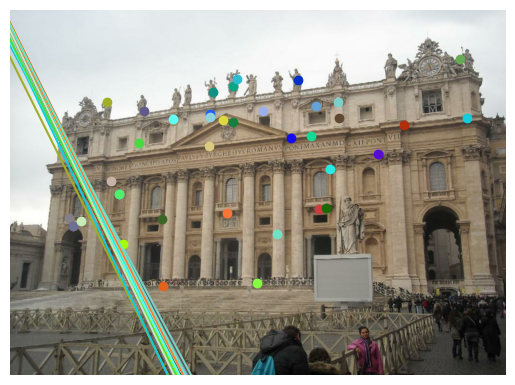

  0%|          | 1112/1000000 [00:00<04:36, 3615.64it/s]

Pytorch estimated epipolar lines for image 1 at step = 0, loss = 195.8289031982422, MSE from GT F = 0.0001934686143466703


 10%|▉         | 99459/1000000 [00:17<02:40, 5614.81it/s]

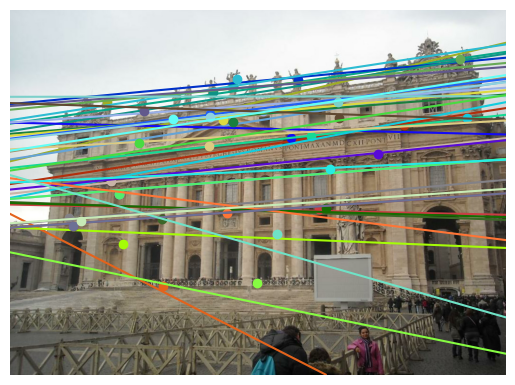

 10%|█         | 100582/1000000 [00:18<03:38, 4113.50it/s]

Pytorch estimated epipolar lines for image 1 at step = 100000, loss = 0.0014845377299934626, MSE from GT F = 0.00012624643334164615


 20%|█▉        | 199553/1000000 [00:35<02:22, 5614.86it/s]

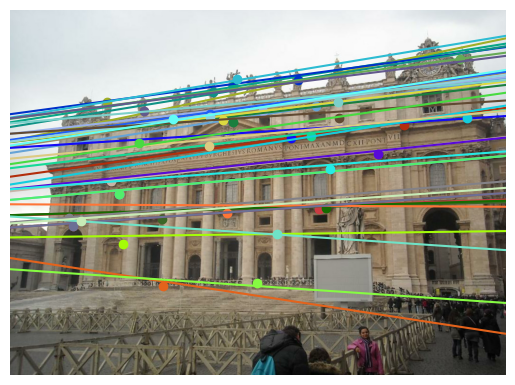

 20%|██        | 200672/1000000 [00:36<03:14, 4115.35it/s]

Pytorch estimated epipolar lines for image 1 at step = 200000, loss = 0.0013467100216075778, MSE from GT F = 8.624436885284231e-05


 30%|██▉       | 299465/1000000 [00:54<02:05, 5586.65it/s]

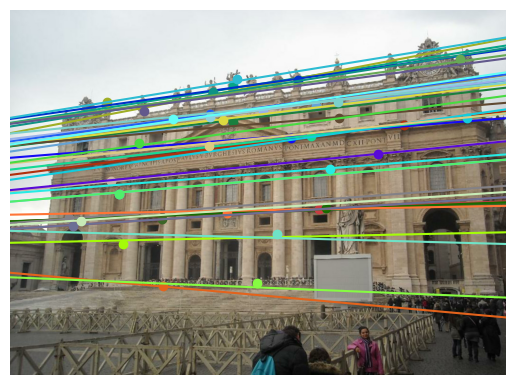

 30%|███       | 300582/1000000 [00:54<02:52, 4044.08it/s]

Pytorch estimated epipolar lines for image 1 at step = 300000, loss = 0.0006876569241285324, MSE from GT F = 5.9008114852701393e-05


 40%|███▉      | 399447/1000000 [01:12<01:46, 5614.53it/s]

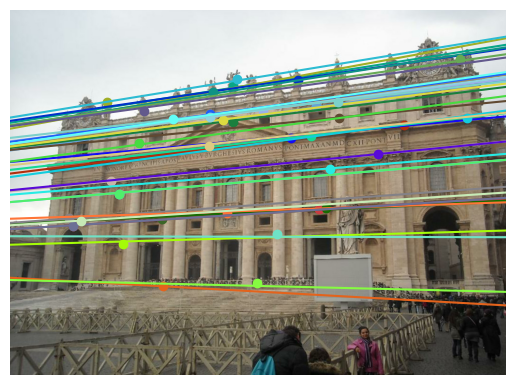

 40%|████      | 400568/1000000 [01:12<02:25, 4106.25it/s]

Pytorch estimated epipolar lines for image 1 at step = 400000, loss = 0.00046896119602024555, MSE from GT F = 4.045204020349629e-05


 50%|████▉     | 499508/1000000 [01:30<01:28, 5626.66it/s]

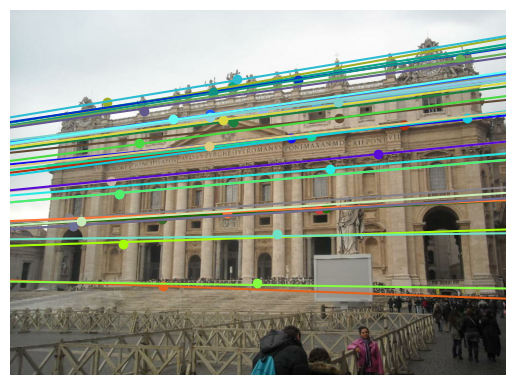

 50%|█████     | 500631/1000000 [01:30<02:01, 4108.33it/s]

Pytorch estimated epipolar lines for image 1 at step = 500000, loss = 0.0003208373091183603, MSE from GT F = 2.7834268856059816e-05


 60%|█████▉    | 599557/1000000 [01:48<01:11, 5602.55it/s]

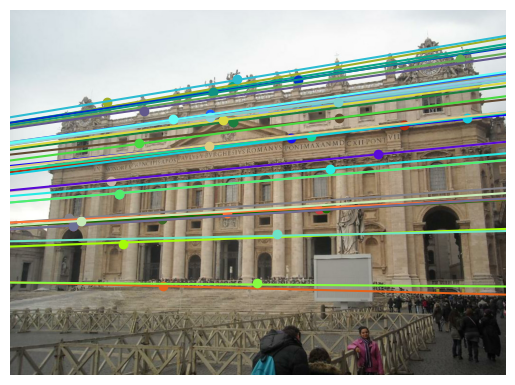

 60%|██████    | 600676/1000000 [01:48<01:43, 3874.65it/s]

Pytorch estimated epipolar lines for image 1 at step = 600000, loss = 0.00022079949849285185, MSE from GT F = 1.9225735359453424e-05


 70%|██████▉   | 699518/1000000 [02:06<00:53, 5579.00it/s]

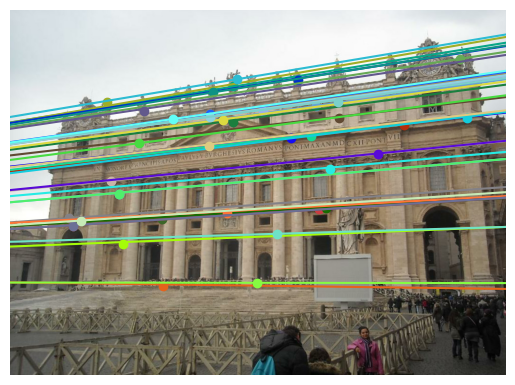

 70%|███████   | 700593/1000000 [02:06<01:14, 4008.45it/s]

Pytorch estimated epipolar lines for image 1 at step = 700000, loss = 0.0002960626734420657, MSE from GT F = 1.3365552173788855e-05


 80%|███████▉  | 799738/1000000 [02:24<00:35, 5604.64it/s]

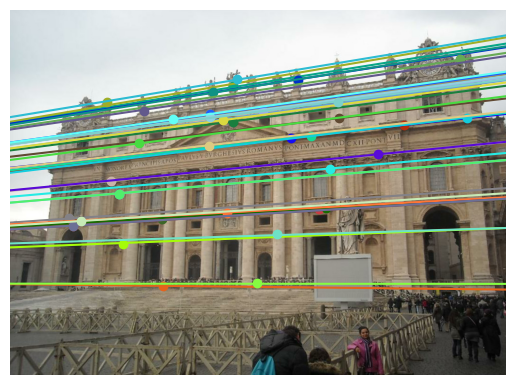

 80%|████████  | 800858/1000000 [02:24<00:48, 4089.19it/s]

Pytorch estimated epipolar lines for image 1 at step = 800000, loss = 0.00010562101670075208, MSE from GT F = 9.36107242814414e-06


 90%|████████▉ | 899715/1000000 [02:42<00:17, 5579.44it/s]

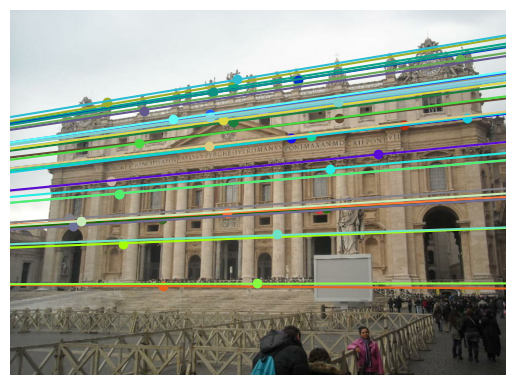

 90%|█████████ | 900822/1000000 [02:42<00:24, 4073.32it/s]

Pytorch estimated epipolar lines for image 1 at step = 900000, loss = 7.800438470439985e-05, MSE from GT F = 6.622090542784606e-06


100%|██████████| 1000000/1000000 [03:00<00:00, 5536.33it/s]


In [7]:
# Preparing optimization parameters and pytorch tensors to optimize.
#
# (5 points) TODO: create a PyTorch tensor of shape (8,), with values randomly
# initialized. We will then concatenate this tensor with a constant of 1.0,
# which will then form a tensor of shape (9,), which we will reshape to use as
# our 3x3 fundamental matrix. This means that we'll have `F_est` where
# `F_est[2,2]=1.0`, and the rest are pytorch tensors. Make sure to make the
# (8,) tensor as as leaf node, i.e. a tensor with requires_grad=True, since we
# will optimize with respect to it.
#
# Also create `x1s` and `x2s`, which are vectors holding the homogeneous
# coordinates of the inlier correspondences from each image.


# (10 points) TODO: write an optimization loop that uses PyTorch's Adam optimizer to find
# the optimal `f_est` that minimizes ||x'^T F_est x||^2_2, where F_est is the
# estimated fundamental matrix and x and x' are the homogenous coordinates
# (i.e., x1s, x2s). Optimize for 100000 iterations, and report intermediate
# visualizations, the loss values, and also the mean squared error (MSE)
# between the ground-truth F and the estimated F, 10 times as shown in the
# example output. 
# 
# YOUR FINAL MSE SHOULD BE LOWER THAN 3e-5. 
#
# Note: We are going to ignore the singularity constraint in the optimization
# loop. Note also that we do not care about the scale of F, so we'll simply
# normalize the ground-truth `F_gt` with the element at `F_gt[2,2]` when
# computing the MSE.


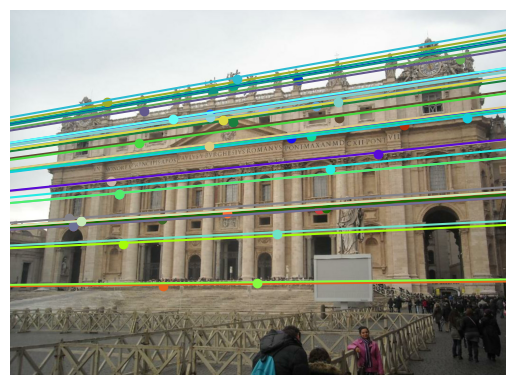

MSE from GT F = 4.7514815003215316e-06


In [8]:
# (10 points) TODO: Make fundamental matrix obey the singularity constraint with svd
F_est_fix =

# (5 points) TODO: Visualize the fixed fundamental matrix, and its MSE from GT
visualize_epipolar_lines()
print(f"MSE from GT F = {}")


## Discussions

(5 points) Discuss how the solution before and after the singularity fix
differ.  (Depending on your result, the final converged result might be
identical. In this case discuss what would've changed if you performed the
singularity fix in your intermediate results.)

YOUR ANSWER HERE

